# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. 
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [122]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [2]:
from PIL import Image   # Phải import từ Pillow chứ không phải tkinter

def get_concat_h(im1, im2):
    # https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))  # Tạo ảnh mới để ghép ngang
    dst.paste(im1, (0, 0))        # Dán ảnh im1 bên trái
    dst.paste(im2, (im1.width, 0))# Dán ảnh im2 bên phải
    return dst                    # Trả về ảnh đã ghép


## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [4]:
my_image = "lenna.png"   # Gán tên file ảnh Lenna vào biến my_image để mở và xử lý sau này


Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [5]:
import os               # Import thư viện os để thao tác với hệ điều hành
cwd = os.getcwd()       # Lấy thư mục làm việc hiện tại (Current Working Directory)
cwd                     # Hiển thị đường dẫn thư mục hiện tại


'd:\\TGMT_B1'

The "path" to an image can be found using the following line of code.


In [6]:
#image_path = os.path.join(cwd, my_image)
image_path = "D:\TGMT_B1\lenna.png".encode('utf-8').decode()  
# Gán đường dẫn đầy đủ tới file ảnh Lenna, xử lý encoding UTF-8 để tránh lỗi ký tự đặc biệt

image_path  # Hiển thị đường dẫn đầy đủ

<>:2: SyntaxWarning: invalid escape sequence '\T'
<>:2: SyntaxWarning: invalid escape sequence '\T'
C:\Users\US\AppData\Local\Temp\ipykernel_12660\3532873955.py:2: SyntaxWarning: invalid escape sequence '\T'
  image_path = "D:\TGMT_B1\lenna.png".encode('utf-8').decode()


'D:\\TGMT_B1\\lenna.png'

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [7]:
import cv2   # Import thư viện OpenCV để xử lý ảnh và video


The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [9]:
image = cv2.imread(my_image)   # Đọc ảnh từ file my_image bằng OpenCV


The result is a numpy array with intensity values as 8-bit unsigned integers. 


In [10]:
type(image)   # Kiểm tra kiểu dữ liệu của biến image, thường là <class 'numpy.ndarray'>


numpy.ndarray

We can get the shape of the array from the `shape` attribute.


In [11]:
image.shape   # Xem kích thước ảnh dưới dạng (height, width, channels) với OpenCV (BGR)


(512, 512, 3)

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [12]:
image.max()   # Trả về giá trị pixel lớn nhất trong toàn bộ ảnh


np.uint8(255)

and


In [13]:
image.min()   # Trả về giá trị pixel nhỏ nhất trong toàn bộ ảnh


np.uint8(3)

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


In [14]:
#cv2.imshow('image', imgage)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

You can also use the `imshow` function from the `matplotlib` library:


In [15]:
import matplotlib.pyplot as plt   # Import thư viện matplotlib để vẽ và hiển thị hình ảnh/đồ thị


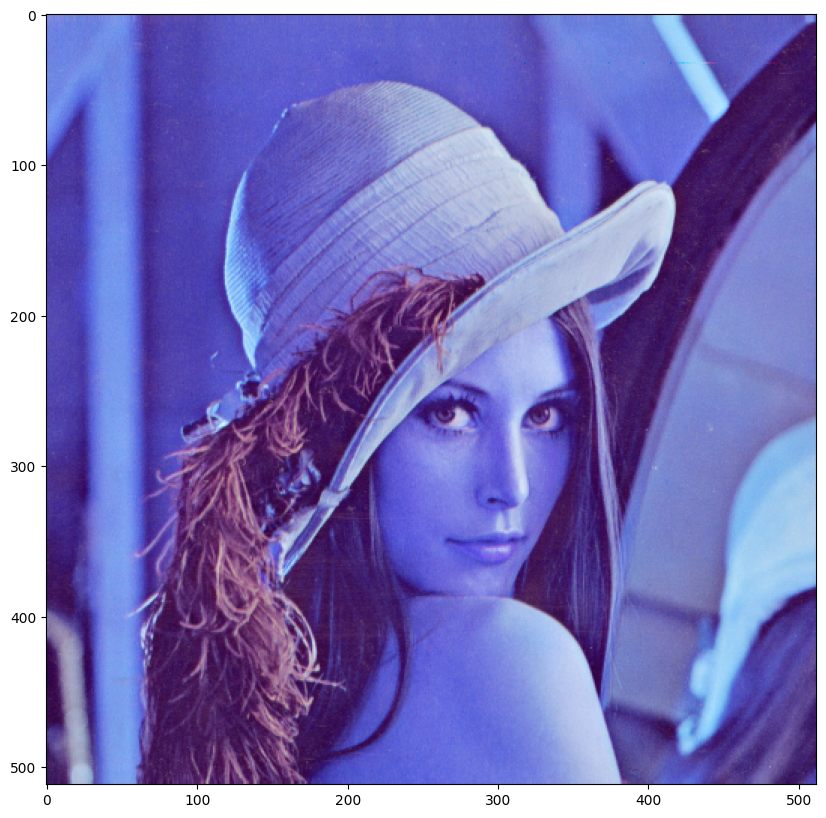

In [16]:
plt.figure(figsize=(10, 10))  # Tạo khung hiển thị lớn 10x10 inch
plt.imshow(image)              # Hiển thị ảnh, nhưng lưu ý OpenCV dùng BGR nên màu sẽ bị sai
plt.show()                     # Hiển thị hình ảnh ra màn hình


The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [17]:
new_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
# Chuyển ảnh từ định dạng BGR (OpenCV) sang RGB để hiển thị màu đúng


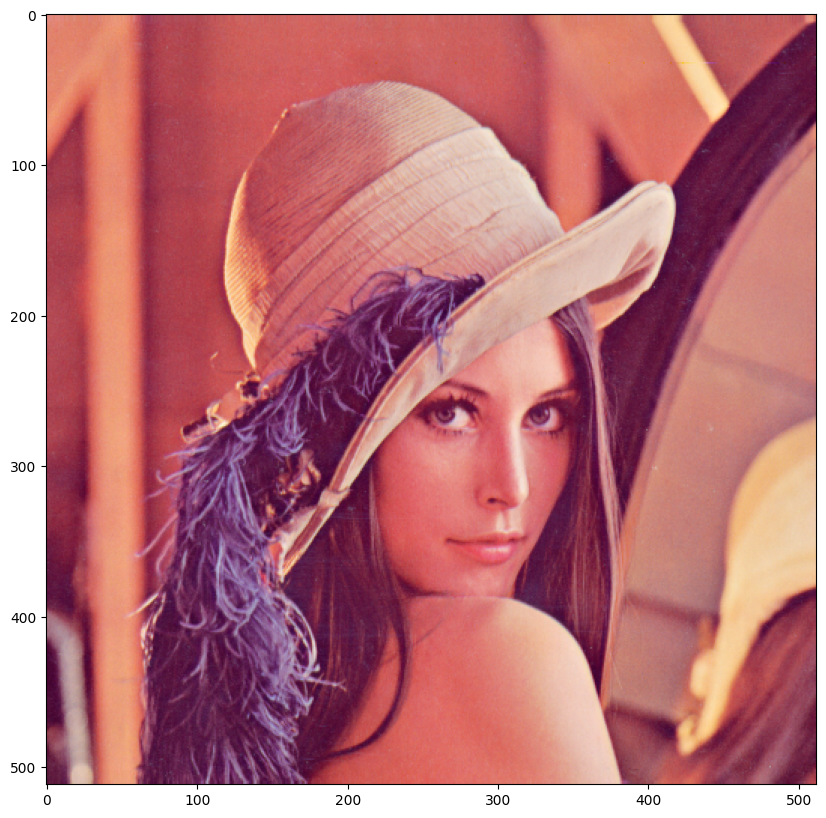

In [18]:
plt.figure(figsize=(10, 10))   # Tạo khung hiển thị lớn 10x10 inch
plt.imshow(new_image)           # Hiển thị ảnh đã chuyển sang RGB
plt.show()                      # Hiển thị hình ảnh ra màn hình


You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [19]:
image = cv2.imread(image_path)   # Đọc ảnh từ đường dẫn đầy đủ image_path bằng OpenCV
image.shape                      # Hiển thị kích thước ảnh dưới dạng (height, width, channels)


(512, 512, 3)

You can save the image as in `jpg` format.


In [20]:
cv2.imwrite("lenna.jpg", image)   # Lưu ảnh image ra file lenna.jpg bằng OpenCV


True

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [21]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  
# Chuyển ảnh màu BGR sang ảnh xám (grayscale) bằng OpenCV


The image array has only two dimensions, i.e. only one color channel:


In [22]:
image_gray.shape  # Trả về kích thước (shape) của ảnh xám dưới dạng tuple (height, width)


(512, 512)

We can plot the image using `imshow` but we have to specify the color map is gray:


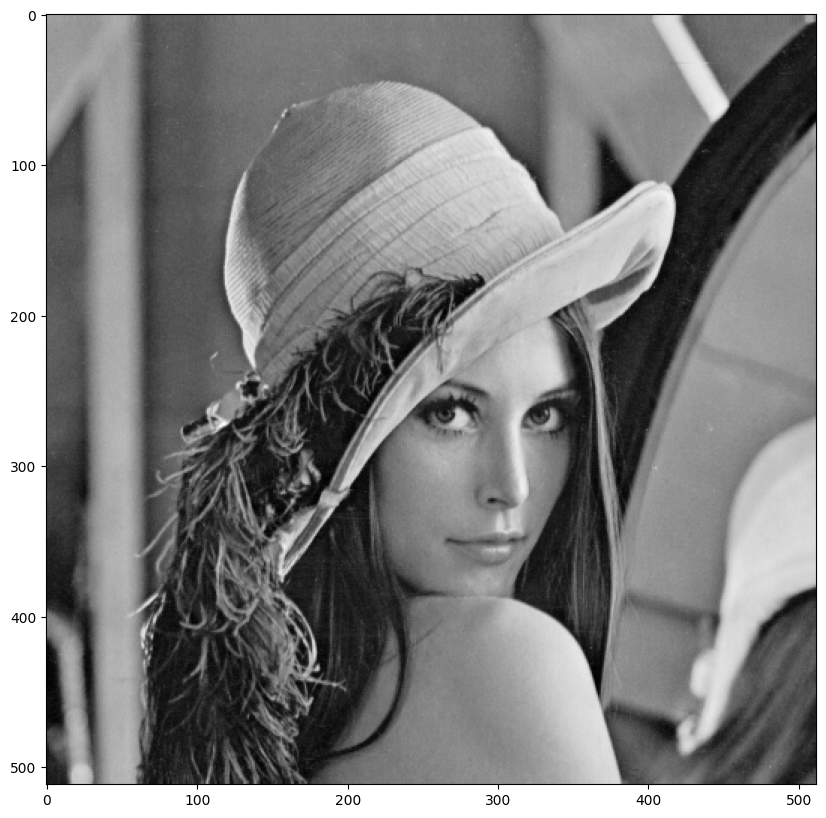

In [23]:
plt.figure(figsize=(10, 10))          # Tạo một khung hình vẽ mới với kích thước 10x10 inch
plt.imshow(image_gray, cmap='gray')   # Hiển thị ảnh xám, dùng bảng màu grayscale
plt.show()                            # Hiển thị ảnh ra màn hình


We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [24]:
cv2.imwrite('lena_gray_cv.jpg', image_gray)  # Lưu ảnh image_gray ra file với tên lena_gray_cv.jpg


True

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [25]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)  # Đọc ảnh từ file và chuyển trực tiếp sang ảnh xám


We can plot the image:


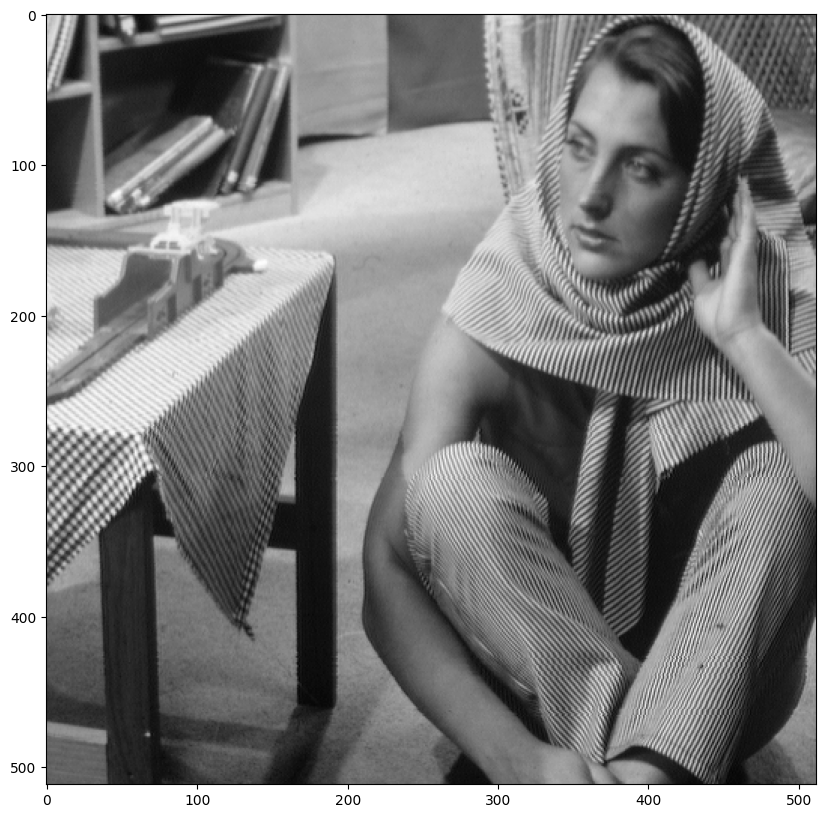

In [26]:
plt.figure(figsize=(10,10))        # Tạo khung hiển thị với kích thước 10x10 inch
plt.imshow(im_gray, cmap='gray')   # Hiển thị ảnh xám với bảng màu grayscale
plt.show()                         # Hiển thị ảnh lên màn hình


### Color Channels  


We can also work with the different color channels. Consider the following image:


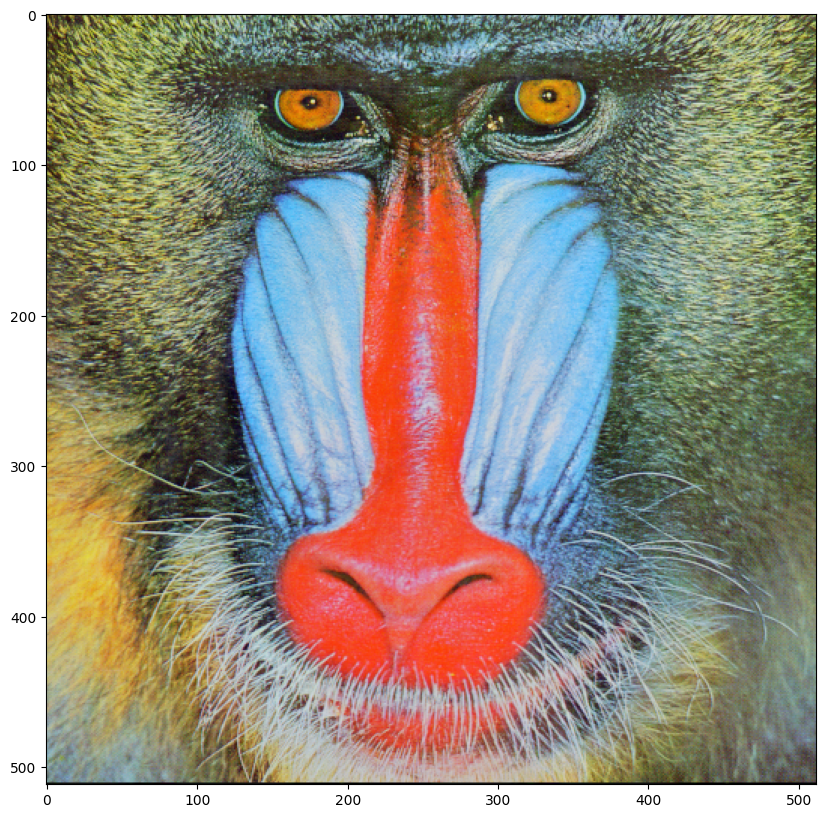

In [27]:
baboon = cv2.imread('baboon.png')                         # Đọc ảnh màu từ file (mặc định là BGR)
plt.figure(figsize=(10,10))                               # Tạo khung hiển thị kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))       # Chuyển ảnh từ BGR sang RGB để hiển thị đúng màu
plt.show()                                                # Hiển thị ảnh lên màn hình


We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [28]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]  
# Tách 3 kênh màu Blue, Green, Red từ ảnh baboon (theo thứ tự BGR của OpenCV)


We can concatenate each image channel the images using the function <code>vconcat</code>.


In [29]:
im_bgr = cv2.vconcat([blue, green, red])  
# Ghép 3 kênh màu Blue, Green, Red theo chiều dọc thành một ảnh


Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


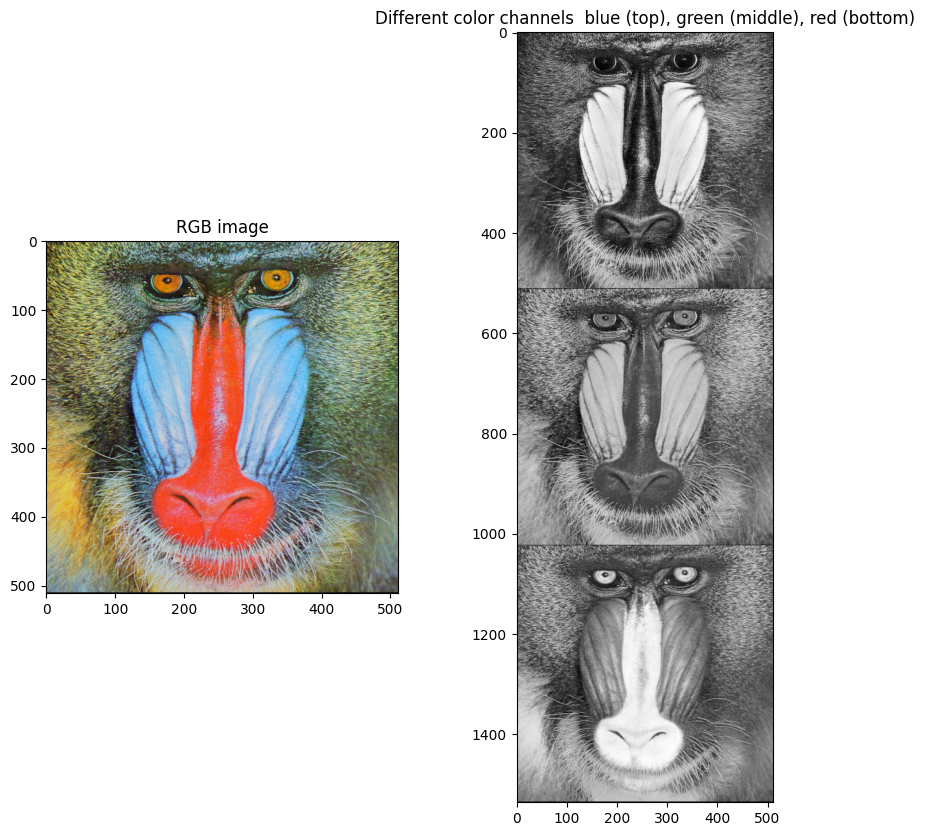

In [30]:
plt.figure(figsize=(10,10))                                   # Tạo khung hình lớn 10x10 inch

plt.subplot(121)                                              # Chia khung hình, chọn ô bên trái (1 hàng, 2 cột)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))           # Hiển thị ảnh màu RGB
plt.title("RGB image")                                        # Tiêu đề ảnh

plt.subplot(122)                                              # Chọn ô bên phải
plt.imshow(im_bgr, cmap='gray')                               # Hiển thị ảnh ghép các kênh màu dưới dạng ảnh xám
plt.title("Different color channels  blue (top), green (middle), red (bottom)")  # Tiêu đề

plt.show()                                                    # Hiển thị toàn bộ hình


### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [34]:
rows = 256

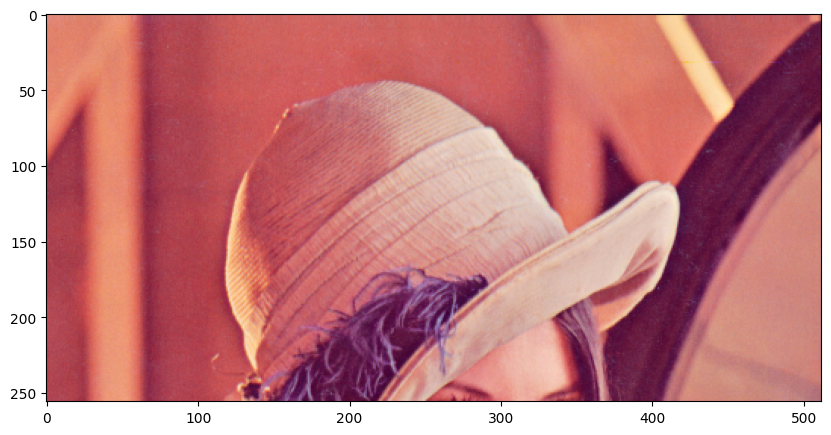

In [35]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[0:rows,:,:])
plt.show()

We can also return the first 256 columns corresponding to the first half of the image:


In [32]:
rows = 256   # Gán số hàng (chiều cao) của ảnh hoặc vùng xử lý là 256 pixel


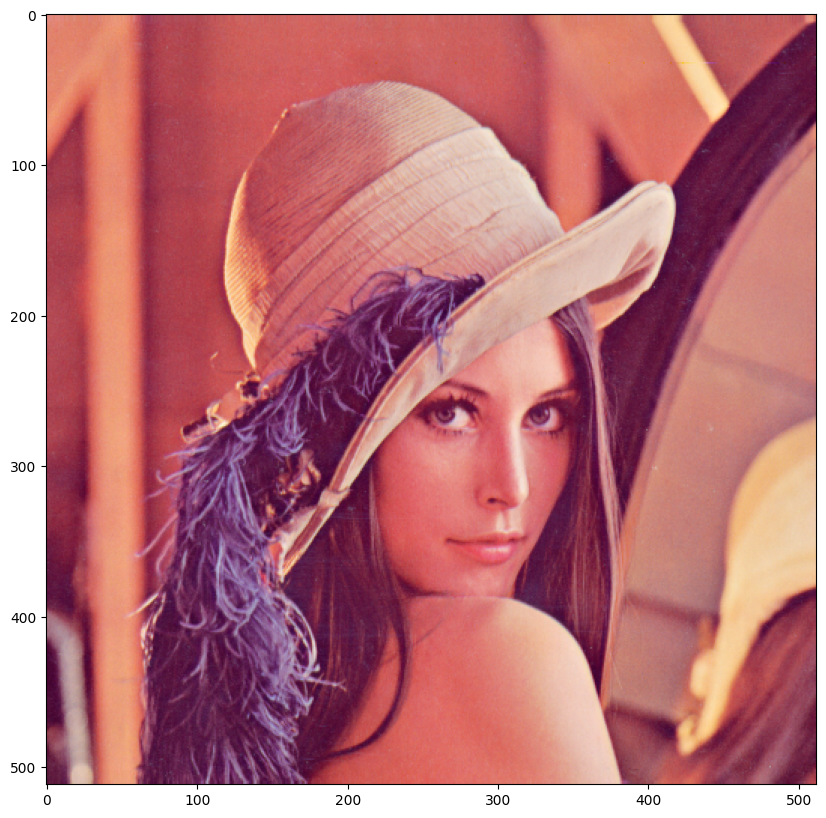

In [40]:
columns = new_image.shape[1]          # Lấy số cột (chiều rộng) của ảnh
plt.figure(figsize=(10,10))           # Tạo khung hiển thị
plt.imshow(new_image[:, 0:columns, :]) # Hiển thị toàn bộ ảnh
plt.show()                             # Hiển thị ảnh


If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


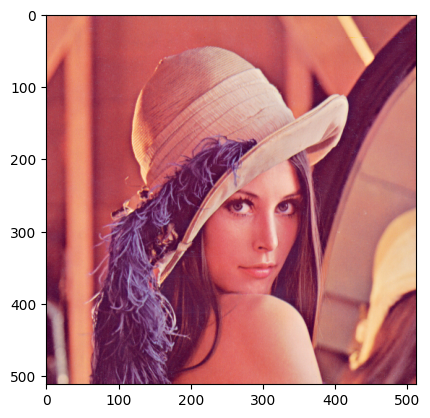

In [41]:
A = new_image.copy()  # Tạo bản sao của ảnh new_image, để thay đổi mà không ảnh hưởng ảnh gốc
plt.imshow(A)         # Hiển thị ảnh A
plt.show()            # Hiển thị lên màn hình


If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


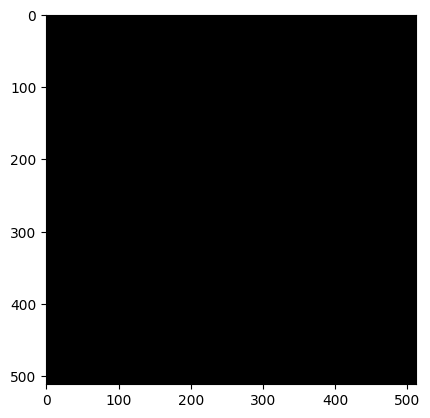

In [42]:
B = A               # B và A cùng trỏ tới cùng một dữ liệu ảnh (không tạo bản sao)
A[:, :, :] = 0      # Gán tất cả giá trị trong A = 0 (ảnh đen)
plt.imshow(B)       # Hiển thị B, nhưng vì B và A cùng dữ liệu nên cũng trở thành ảnh đen
plt.show()


We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


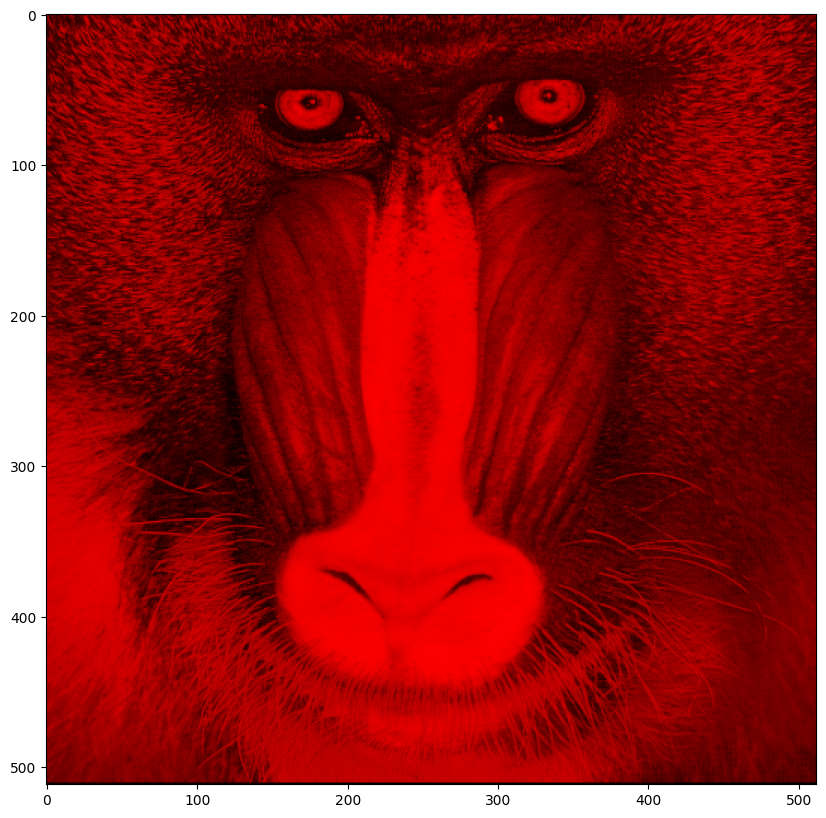

In [43]:
baboon_red = baboon.copy()                 # Tạo bản sao của ảnh baboon để không thay đổi ảnh gốc
baboon_red[:, :, 0] = 0                    # Đặt kênh Blue = 0
baboon_red[:, :, 1] = 0                    # Đặt kênh Green = 0
plt.figure(figsize=(10, 10))              # Tạo khung hiển thị 10x10 inch
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))  # Chuyển BGR -> RGB và hiển thị ảnh
plt.show()                                 # Hiển thị ảnh lên màn hình


We can do the same for blue:  


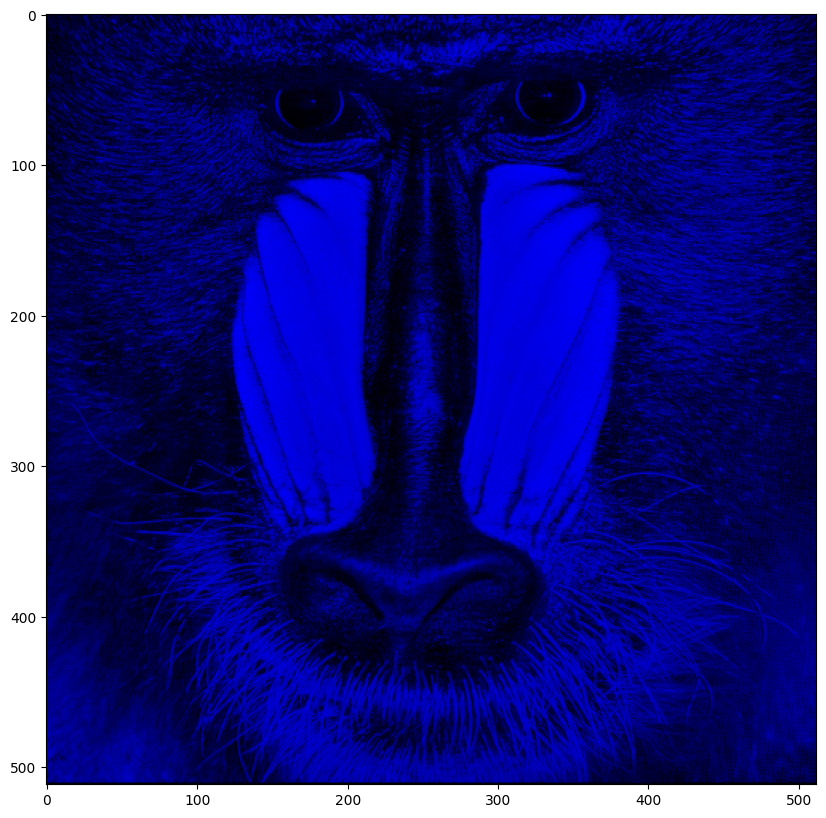

In [44]:
baboon_blue = baboon.copy()                 # Tạo bản sao của ảnh baboon
baboon_blue[:, :, 1] = 0                    # Đặt kênh Green = 0
baboon_blue[:, :, 2] = 0                    # Đặt kênh Red = 0
plt.figure(figsize=(10, 10))               # Tạo khung hiển thị 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  # Chuyển BGR -> RGB và hiển thị ảnh
plt.show()                                  # Hiển thị ảnh lên màn hình


We can do the same for green:


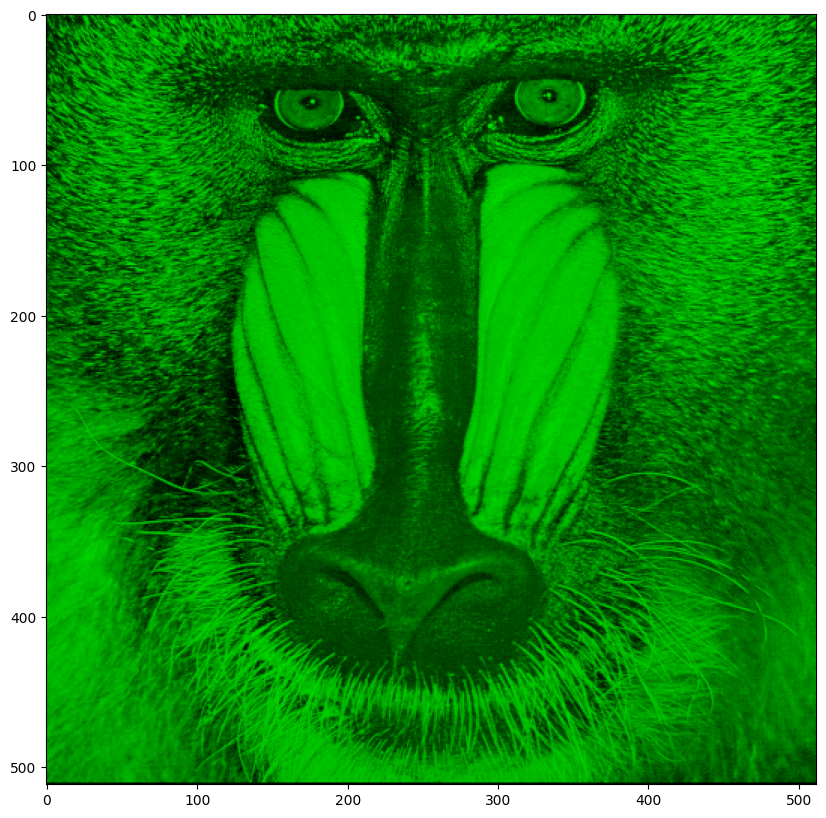

In [45]:
baboon_green = baboon.copy()                # Tạo bản sao của ảnh baboon
baboon_green[:, :, 0] = 0                   # Đặt kênh Blue = 0
baboon_green[:, :, 2] = 0                   # Đặt kênh Red = 0
plt.figure(figsize=(10,10))                # Tạo khung hiển thị 10x10 inch
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))  # Chuyển BGR -> RGB và hiển thị ảnh
plt.show()                                  # Hiển thị ảnh lên màn hình


In [46]:
image = cv2.imread('baboon.png')  # Đọc ảnh baboon.png vào biến 'image' (mặc định là BGR)


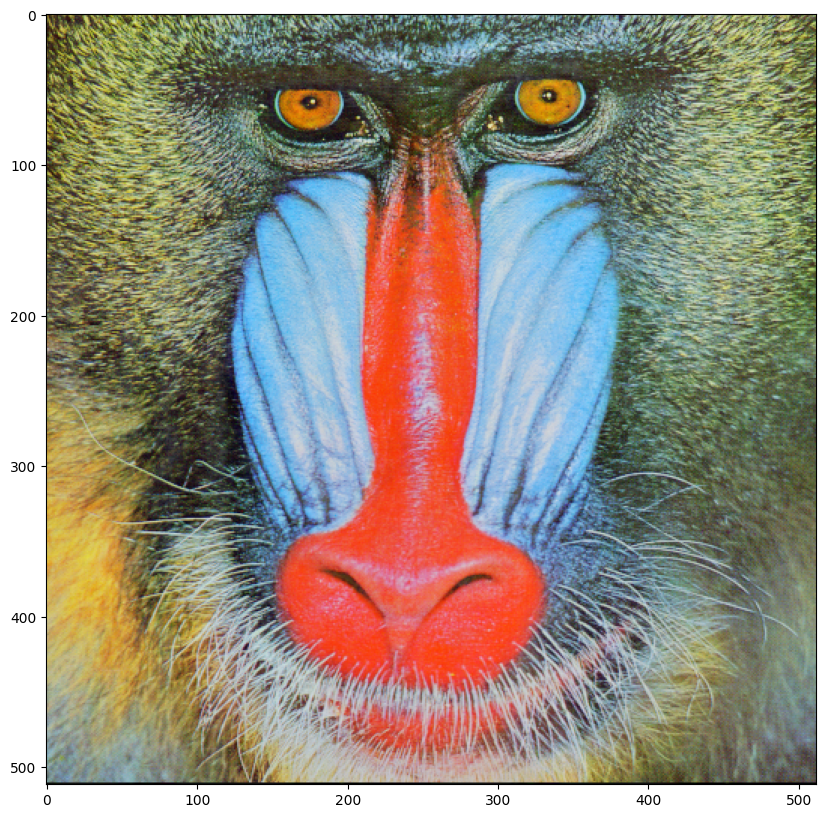

In [47]:
plt.figure(figsize=(10,10))                             # Tạo khung hiển thị 10x10 inch
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))      # Chuyển ảnh từ BGR sang RGB để hiển thị đúng màu
plt.show()                                              # Hiển thị ảnh lên màn hình


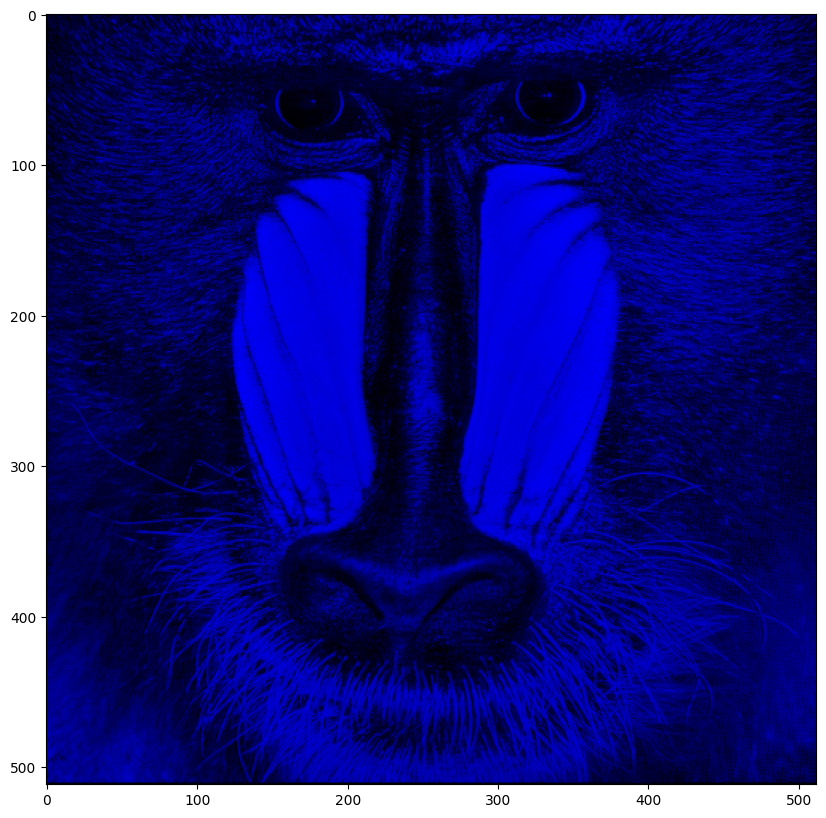

In [48]:
image = cv2.imread('baboon.png')          # Đọc ảnh baboon.png vào biến 'image' (BGR)
baboon_blue = image.copy()                # Tạo bản sao để không thay đổi ảnh gốc
baboon_blue[:, :, 1] = 0                  # Đặt kênh Green = 0
baboon_blue[:, :, 2] = 0                  # Đặt kênh Red = 0
plt.figure(figsize=(10,10))               # Tạo khung hiển thị 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  # Chuyển BGR -> RGB và hiển thị ảnh
plt.show()                                 # Hiển thị ảnh lên màn hình


### Question 1: 
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


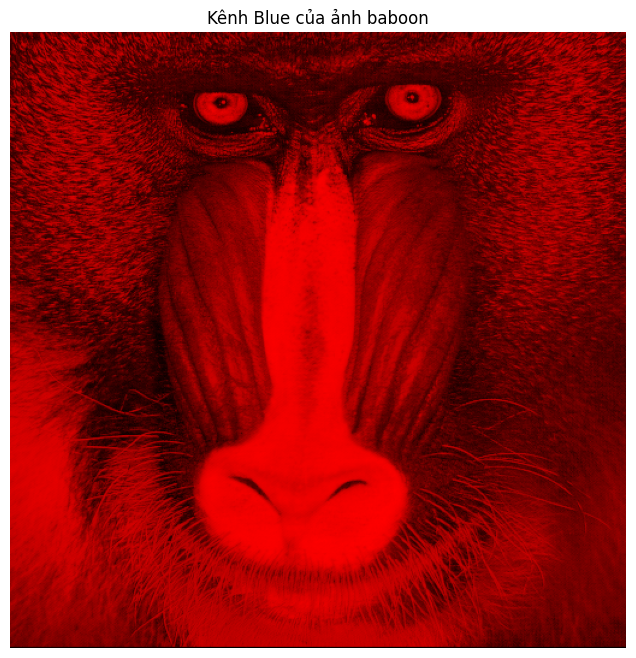

In [51]:
import cv2
import matplotlib.pyplot as plt

# 1. Đọc ảnh từ file (mặc định OpenCV đọc ảnh dưới dạng BGR)
image = cv2.imread('baboon.png')  

# 2. Chuyển ảnh từ BGR sang RGB để hiển thị đúng màu với Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 3. Tạo bản sao ảnh để giữ kênh Blue
baboon_blue = image_rgb.copy()

# 4. Giữ lại chỉ kênh Blue, đặt Red và Green = 0
baboon_blue[:, :, 1] = 0  # Green = 0
baboon_blue[:, :, 2] = 0  # Red = 0

# 5. Hiển thị ảnh
plt.figure(figsize=(8,8))
plt.imshow(baboon_blue)
plt.title("Kênh Blue của ảnh baboon")
plt.axis('off')  # Tắt hiển thị trục
plt.show()


In [49]:
# So sánh PIL (Pillow) và OpenCV

 PIL:
   Phù hợp xử lý ảnh cơ bản, thao tác file ảnh.
   Hỗ trợ nhiều định dạng .
   Dữ liệu dưới dạng `Image` object.
   Chậm hơn OpenCV, không hỗ trợ video trực tiếp.

 OpenCV :
   Phù hợp xử lý ảnh nâng cao, video, và real-time.
   Hỗ trợ nhiều định dạng, mặc định BGR.
   Dữ liệu dưới dạng `numpy array`, dễ tính toán.
   Nhanh, hỗ trợ đọc/ghi video, nhiều kiểu chuyển đổi màu.

Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->
